## Install Libraries

In [1]:
! pip install cython
! pip install git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI&egg=pycocotools
! pip install git+https://github.com/cocodataset/panopticapi.git#egg=panopticapi
! pip install scipy
! pip install onnx
! pip install onnxruntime

  Cloning https://github.com/cocodataset/panopticapi.git to /tmp/pip-install-5jciut10/panopticapi_38d9284770834c97a89332c06074e742
  Running command git clone --quiet https://github.com/cocodataset/panopticapi.git /tmp/pip-install-5jciut10/panopticapi_38d9284770834c97a89332c06074e742
  Resolved https://github.com/cocodataset/panopticapi.git to commit 7bb4655548f98f3fedc07bf37e9040a992b054b0
  Preparing metadata (setup.py) ... done


In [2]:
! pwd
! nvidia-smi

/scrfs/storage/sunandad/home/Downloads/HW3-V2
Thu Feb 27 18:07:02 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.127.05             Driver Version: 550.127.05     CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA A100-SXM4-40GB          On  |   00000000:01:00.0 Off |                    0 |
| N/A   32C    P0             51W /  400W |       1MiB /  40960MiB |      0%   E. Process |
|                                         |                        |             Disabled |
+-

## Decompress Data and Code

In [3]:
#! unzip -qq detr.zip -d /content/
#! unzip -qq license-plate-detection-datasets.zip -d /content/
%cd detr

/scrfs/storage/sunandad/home/Downloads/HW3-V2/detr


## Starting Training

We will start training via torchrun for distributed training.

```bash
torchrun --nnodes=${NUM_MACHINES} --nproc-per-node=${NUM_GPUS_PER_MACHINE} \
    main.py --device cuda \
    --num_classes 1 \
    --dataset_file character \
    --coco_path ${DATA_DIR} \
    --backbone resnet50 \
    --output_dir ckpts/detr-lp-r50 \
    --batch_size 2 \
    --num_queries 10

```

DATA_DIR: Define the path to the dataset folder.

NUM_MACHINES: Number of machines you are using to train your model.

NUM_GPUS_PER_MACHINE: Number of GPUs per machine you are using to train your model.

num_queries: Number of queries in the Transformer (should be higher than maximum number of bounding boxes per image).

In [4]:
# Start Training

! torchrun --nnodes=1 --nproc-per-node=4 \
    main.py --device cuda \
    --num_classes 1 \
    --dataset_file character \
    --coco_path /home/sunandad/Downloads/HW3-V2/license-plate-detection-datasets \
    --backbone resnet50 \
    --output_dir ckpts/detr-lp-r50 \
    --batch_size 4 \
    --num_queries 10 \
    --resume /home/sunandad/Downloads/HW3-V2/checkpoint0300.pth

| distributed init (rank 0): env://
| distributed init (rank 3): env://
[rank3]:[W227 18:14:01.114270058 ProcessGroupNCCL.cpp:4561] [PG ID 0 PG GUID 0 Rank 3]  using GPU 3 to perform barrier as devices used by this process are currently unknown. This can potentially cause a hang if this rank to GPU mapping is incorrect. Specify device_ids in barrier() to force use of a particular device, or call init_process_group() with a device_id.
[rank0]:[W227 18:14:01.114273695 ProcessGroupNCCL.cpp:4561] [PG ID 0 PG GUID 0 Rank 0]  using GPU 0 to perform barrier as devices used by this process are currently unknown. This can potentially cause a hang if this rank to GPU mapping is incorrect. Specify device_ids in barrier() to force use of a particular device, or call init_process_group() with a device_id.
| distributed init (rank 2): env://
| distributed init (rank 1): env://
[rank1]:[W227 18:14:01.117481834 ProcessGroupNCCL.cpp:4561] [PG ID 0 PG GUID 0 Rank 1]  using GPU 1 to perform barrier as de

## Inference

In [5]:
import torch
import torchvision
import matplotlib.pyplot as plt
from PIL import Image

from dataclasses import dataclass
from models import build_model
from models.backbone import Backbone, Joiner
from models.detr import DETR, PostProcess
from models.transformer import Transformer
from models.position_encoding import PositionEmbeddingSine

## Define Model Arguments

In [6]:
@dataclass
class Arguments:
    device: str = 'cuda:0'
    num_classes: int = 1
    backbone: str = "resnet50"
    hidden_dim: int = 256
    dropout: float = 0.1
    nheads: int = 8
    dim_feedforward: int = 2048
    enc_layers: int = 6
    dec_layers: int = 6
    pre_norm: bool = False
    num_queries: int = 10

## Load Detection Model

In [7]:
args = Arguments()

N_steps = args.hidden_dim // 2

position_embedding = PositionEmbeddingSine(N_steps, normalize=True)
backbone_ = Backbone(args.backbone, False, False, False)
backbone = Joiner(backbone_, position_embedding)
backbone.num_channels = backbone_.num_channels
transformer = Transformer(
        d_model=args.hidden_dim,
        dropout=args.dropout,
        nhead=args.nheads,
        dim_feedforward=args.dim_feedforward,
        num_encoder_layers=args.enc_layers,
        num_decoder_layers=args.dec_layers,
        normalize_before=args.pre_norm,
        return_intermediate_dec=True,
    )

model = DETR(
        backbone,
        transformer,
        num_classes=args.num_classes,
        num_queries=args.num_queries,
)

/home/sunandad/.conda/envs/deeplearning/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/sunandad/.conda/envs/deeplearning/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


## Define Inerence Image Transformation

In [8]:
# standard PyTorch mean-std input image normalization
transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize(800),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# for output bounding box post-processing
def box_cxcywh_to_xyxy(x):
    x_c, y_c, w, h = x.unbind(1)
    b = [(x_c - 0.5 * w), (y_c - 0.5 * h),
         (x_c + 0.5 * w), (y_c + 0.5 * h)]
    return torch.stack(b, dim=1)

def rescale_bboxes(out_bbox, size):
    img_w, img_h = size
    b = box_cxcywh_to_xyxy(out_bbox)
    b = b * torch.tensor([img_w, img_h, img_w, img_h], dtype=torch.float32)
    return b

## Define Functions for Detection and Visualization

In [9]:
def detect(im, model, transform, threshold=0.7):
    # mean-std normalize the input image (batch-size: 1)
    img = transform(im).unsqueeze(0)

    # demo model only support by default images with aspect ratio between 0.5 and 2
    # if you want to use images with an aspect ratio outside this range
    # rescale your image so that the maximum size is at most 1333 for best results
    assert img.shape[-2] <= 1600 and img.shape[-1] <= 1600, 'demo model only supports images up to 1600 pixels on each side'

    # propagate through the model
    outputs = model(img)

    # keep only predictions with threshold+ confidence
    probas = outputs['pred_logits'].softmax(-1)[0, :, :-1]
    keep = probas.max(-1).values > threshold

    # convert boxes from [0; 1] to image scales
    bboxes_scaled = rescale_bboxes(outputs['pred_boxes'][0, keep], im.size)
    return probas[keep], bboxes_scaled

def plot_results(pil_img, prob, boxes):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    COLORS = [[0.000, 0.447, 0.741], [0.850, 0.325, 0.098], [0.929, 0.694, 0.125],
          [0.494, 0.184, 0.556], [0.466, 0.674, 0.188], [0.301, 0.745, 0.933]]
    ax = plt.gca()
    for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), COLORS * 100):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3))
        cl = p.argmax()
        text = f'license-plate: {p[cl]:0.2f}'
        ax.text(xmin, ymin, text, fontsize=15,
                bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.show()

In [10]:
import torch

ckpt_path = "/home/sunandad/Downloads/HW3-V2/detr/ckpts/detr-lp-r50/checkpoint0450.pth"
checkpoint = torch.load(ckpt_path, map_location="cpu", weights_only=False)

print(checkpoint.keys())  

dict_keys(['model', 'optimizer', 'lr_scheduler', 'epoch', 'args'])


## Load Model From Checkpoint

In [11]:
ckpt_path = "/home/sunandad/Downloads/HW3-V2/detr/ckpts/detr-lp-r50/checkpoint0450.pth"
checkpoint = torch.load(ckpt_path, map_location="cpu", weights_only=False)
msg = model.load_state_dict(checkpoint['model'])
print(f"Loaded Model From {ckpt_path}: {msg}")

Loaded Model From /home/sunandad/Downloads/HW3-V2/detr/ckpts/detr-lp-r50/checkpoint0450.pth: <All keys matched successfully>


## Perform Detection

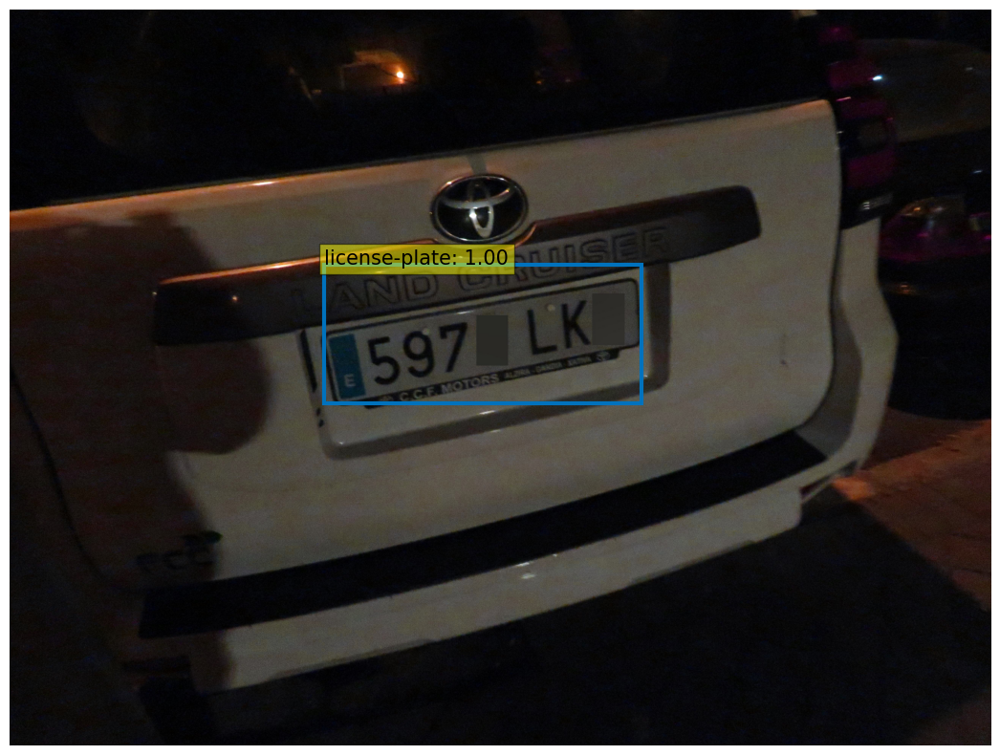

In [12]:
image_path = "/home/sunandad/Downloads/HW3-V2/license-plate-detection-datasets/data/00000.jpg"
image = Image.open(image_path)
scores, boxes = detect(image, model, transform, threshold=0.8)
plot_results(image, scores, boxes)

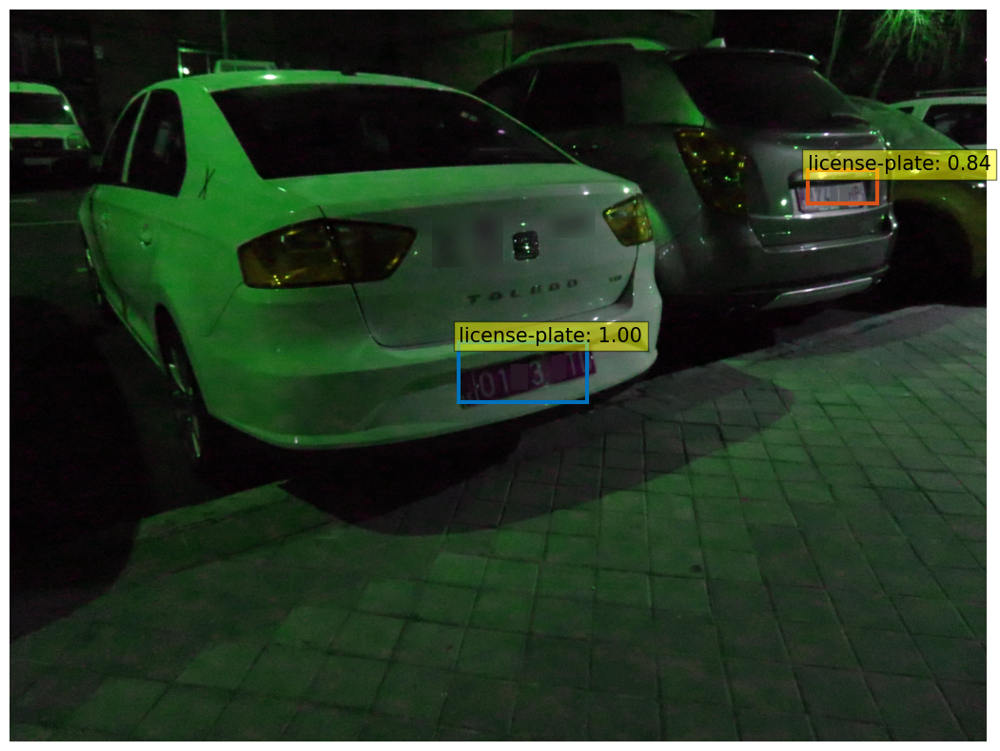

In [13]:
image_path = "/home/sunandad/Downloads/HW3-V2/license-plate-detection-datasets/data/00003.jpg"
image = Image.open(image_path)
scores, boxes = detect(image, model, transform, threshold=0.8)
plot_results(image, scores, boxes)

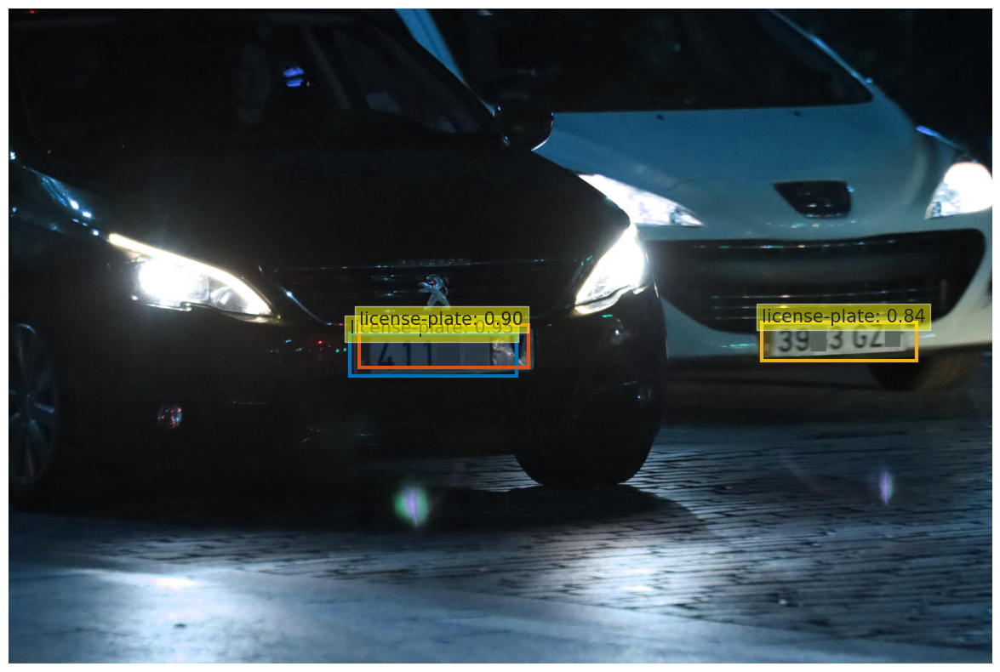

In [38]:
#image_path = "/home/sunandad/Downloads/HW3-V2/license-plate-detection-datasets/data/00378.jpg"
image_path = "/home/sunandad/Downloads/HW3-V2/license-plate-detection-datasets/data/00526.jpg"
image = Image.open(image_path)
scores, boxes = detect(image, model, transform, threshold=0.8)
plot_results(image, scores, boxes)

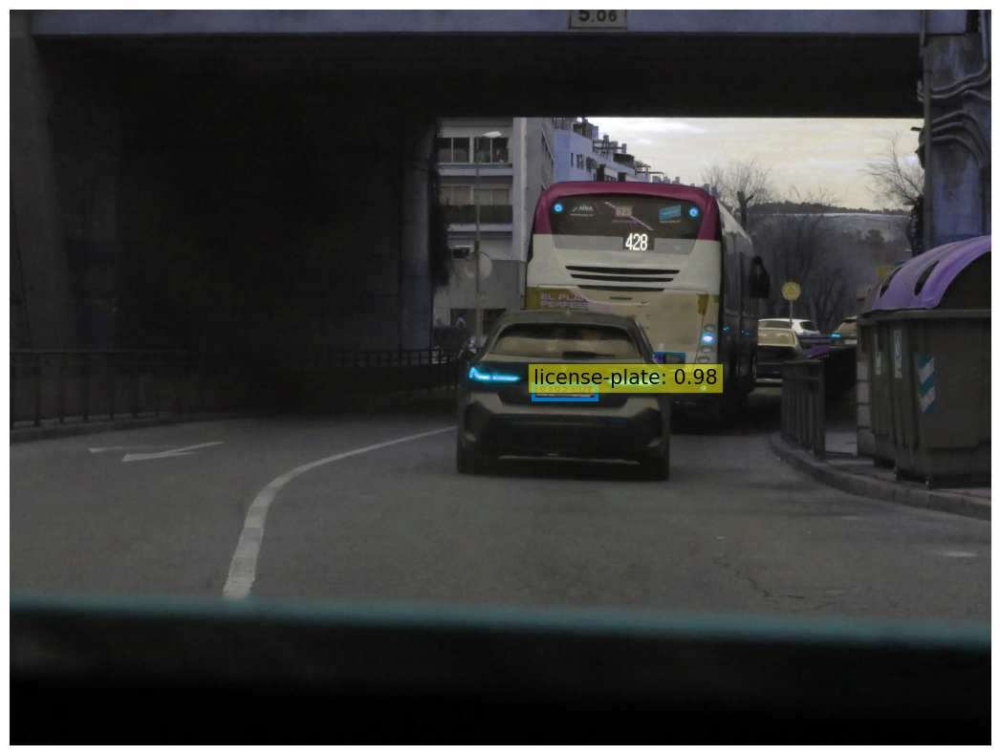

In [15]:
image_path = "/home/sunandad/Downloads/HW3-V2/license-plate-detection-datasets/data/00136.jpg"
image = Image.open(image_path)
scores, boxes = detect(image, model, transform, threshold=0.8)
plot_results(image, scores, boxes)

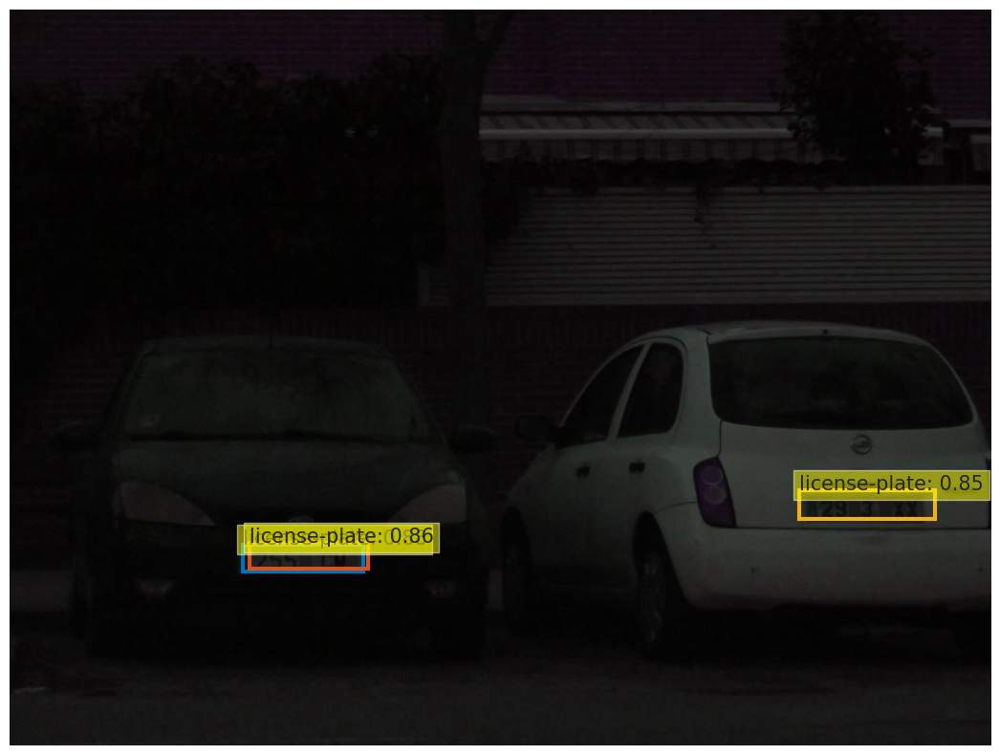

In [46]:
image_path = "/home/sunandad/Downloads/HW3-V2/license-plate-detection-datasets/data/00350.jpg"
image = Image.open(image_path)
scores, boxes = detect(image, model, transform, threshold=0.8)
plot_results(image, scores, boxes)

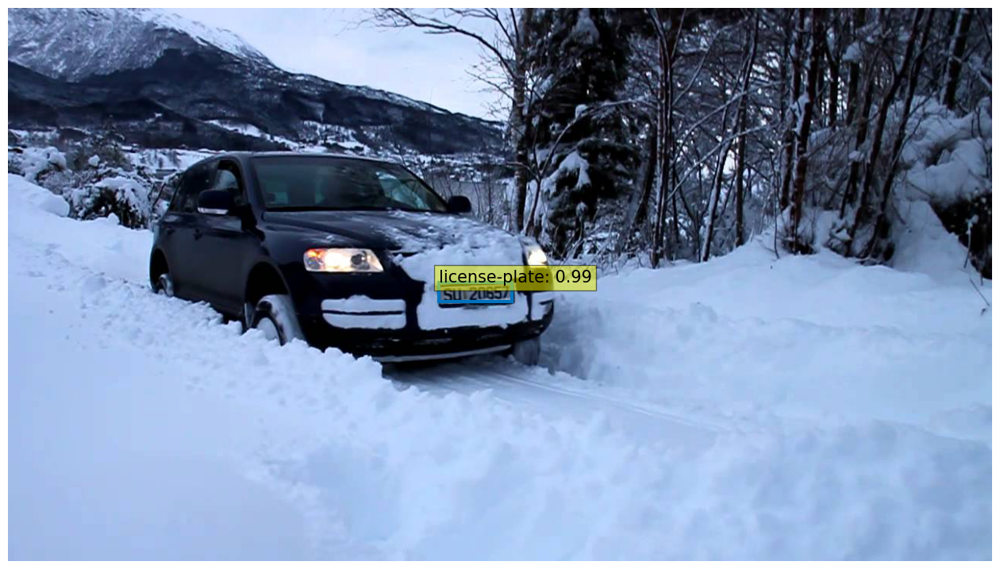

In [17]:
image_path = "/home/sunandad/Downloads/HW3-V2/real-world/t6.jpg"
image = Image.open(image_path)
scores, boxes = detect(image, model, transform, threshold=0.8)
plot_results(image, scores, boxes)

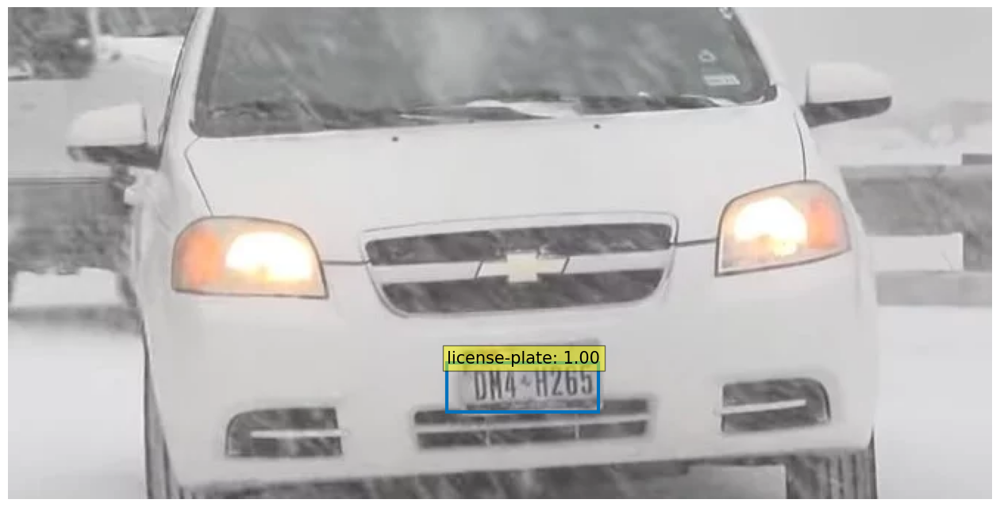

In [18]:
image_path = "/home/sunandad/Downloads/HW3-V2/real-world/t2.webp"
image = Image.open(image_path)
scores, boxes = detect(image, model, transform, threshold=0.8)
plot_results(image, scores, boxes)

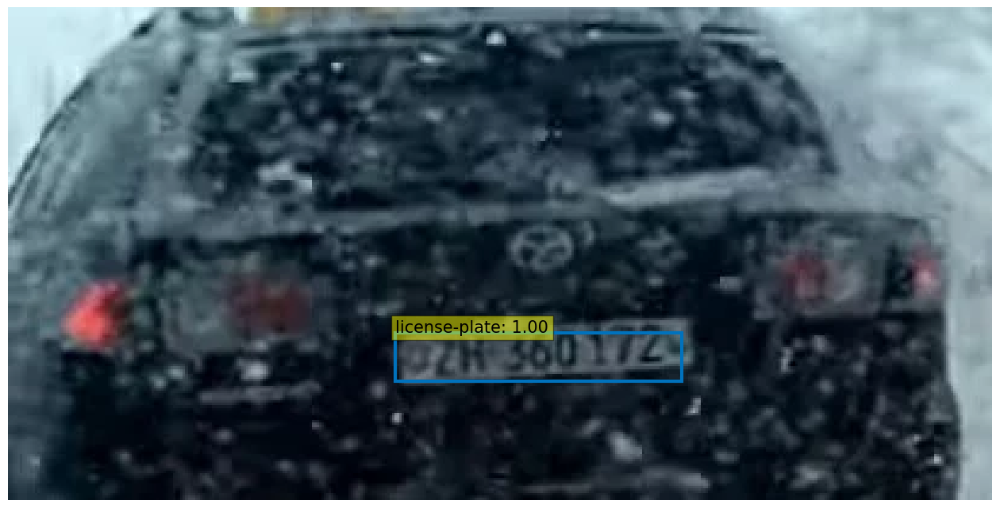

In [19]:
image_path = "/home/sunandad/Downloads/HW3-V2/real-world/t3.webp"
image = Image.open(image_path)
scores, boxes = detect(image, model, transform, threshold=0.8)
plot_results(image, scores, boxes)

In [21]:
import json
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


log_file = "/home/sunandad/Downloads/HW3-V2/detr/ckpts/detr-lp-r50/log.txt"

# Read the JSON log line by line
log_data = []
with open(log_file, "r") as f:
    for line in f:
        try:
            log_data.append(json.loads(line))  # Parse each line separately
        except json.JSONDecodeError as e:
            print(f"Skipping invalid JSON line: {e}")


df = pd.DataFrame(log_data)
#print(df.head())


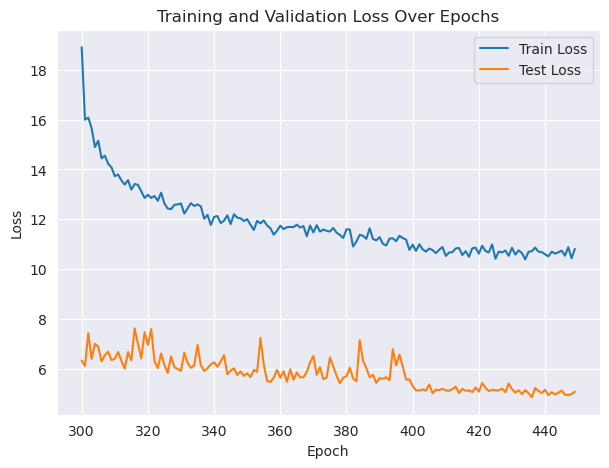

In [23]:
sns.set_style("darkgrid")

# Plot training and test loss
plt.figure(figsize=(7, 5))
sns.lineplot(x=df["epoch"], y=df["train_loss"], label="Train Loss")
sns.lineplot(x=df["epoch"], y=df["test_loss"], label="Test Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Validation Loss Over Epochs")
plt.legend()
plt.show()

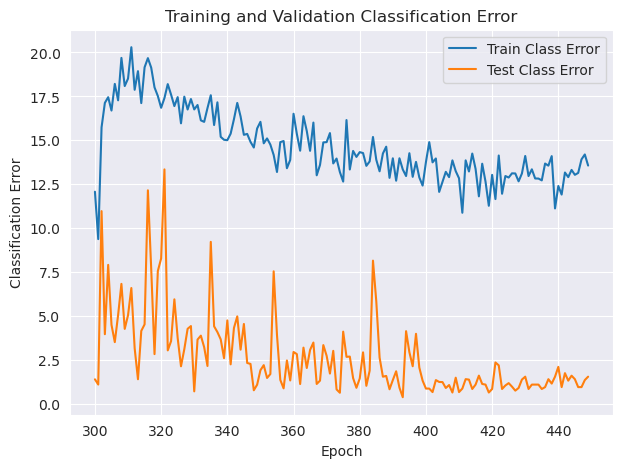

In [25]:
# Plot classification error
plt.figure(figsize=(7, 5))
sns.lineplot(x=df["epoch"], y=df["train_class_error"], label="Train Class Error")
sns.lineplot(x=df["epoch"], y=df["test_class_error"], label="Test Class Error")
plt.xlabel("Epoch")
plt.ylabel("Classification Error")
plt.title("Training and Validation Classification Error")
plt.legend()
plt.show()